In [1]:
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import time
import numpy as np
from torch.utils.data import Dataset, DataLoader
import torchvision

class advDataSet(Dataset):
    def __init__(self, mode='train'):
        self.mode = mode
        print('Loading dataset...')
        if self.mode == 'train':
            self.img_data = np.load('dataset/X_train.npy')
            self.label = np.load('dataset/y_train.npy')
        elif self.mode == 'test':
            self.img_data = np.load('dataset/X_test.npy')
            self.label = np.load('dataset/y_test.npy')
        elif self.mode == 'mixed':
            self.img_data = np.concatenate(
                (np.load('dataset/X_train.npy'), np.load('dataset/X_test.npy')),
                axis = 0
            )
            self.label = np.concatenate(
                (np.load('dataset/y_train.npy'), np.load('dataset/y_test.npy'))
            )
        else:
            raise RuntimeError
        assert len(self.img_data) == len(self.label)
        print("Initialized {} Dataset Done!".format(mode))

    
    def __len__(self):
        return len(self.img_data)
    
    def __getitem__(self,idx):
        img = self.img_data[idx].transpose((2,0,1))
        label = self.label[idx]
        return torch.from_numpy(img).float(), label

In [2]:
import torch.nn as nn
import torch.nn.functional as F

class Model(nn.Module):
    def __init__(self, base_model):
        super(Model, self).__init__()
        self.base_model = base_model
        self.top_layer = nn.Sequential(
            nn.Linear(1000,10),
        )

    def forward(self,inp):
        out = self.base_model( inp )
        out = self.top_layer( out )
        return out, F.softmax(out, dim=1)

def get_model():
    base = torch.hub.load('pytorch/vision:v0.6.0','mobilenet_v2',pretrained=False)
    model = Model(base)
    model.load_state_dict(
        torch.load('cls_model_zoo/mobilenet_v2.ckpt')
    )
    return model

In [3]:
import torch.nn as nn
from math import sqrt
class Discriminator(nn.Module):
    def __init__(self, channels_in):
        super(Discriminator, self).__init__()
        # npy: 160*160*3
        model = [
            nn.Conv2d(channels_in, 8, kernel_size=4, stride=2, padding=0, bias=True),
            nn.LeakyReLU(0.2),
            # 8*79*79
           
           nn.Conv2d(8, 16, kernel_size=4, stride=2, padding=0, bias=True),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(0.2),
            # 16*38*38
            
            nn.Conv2d(16, 32, kernel_size=4, stride=2, padding=0, bias=True),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2),
            # 32*18*18

            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=0, bias=True),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2), 
            # 64*8*8

            nn.Conv2d(64, 128, kernel_size=8, stride=1, padding=0, bias=True),
            nn.Sigmoid()
            # 128*1*1
        ]
        self.model = nn.Sequential(*model)

    def forward(self, x):
        output = self.model(x).squeeze()
        return output

    def weights_init(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, sqrt(2. / n))

class Generator(nn.Module):
    def __init__(self,channels_in,channels_out):
        super(Generator, self).__init__()

        encoder_lis = [
            nn.Conv2d(channels_in, 8, kernel_size=3, stride=1, padding=0, bias=True),
            nn.InstanceNorm2d(8),
            nn.ReLU(),

            nn.Conv2d(8, 16, kernel_size=3, stride=2, padding=0, bias=True),
            nn.InstanceNorm2d(16),
            nn.ReLU(),

            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=0, bias=True),
            nn.InstanceNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=0, bias=True),
            nn.InstanceNorm2d(64),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=0, bias=True),
            nn.InstanceNorm2d(128),
            nn.ReLU(),
        ]

        bottle_neck_lis = [ResnetBlock(128),
                       ResnetBlock(128),
                       ResnetBlock(128),
                       ResnetBlock(128),]

        decoder_lis = [
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=0, bias=False),
            nn.InstanceNorm2d(64),
            nn.ReLU(),
            
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=0, bias=False),
            nn.InstanceNorm2d(32),
            nn.ReLU(),
            
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=0, bias=False),
            nn.InstanceNorm2d(16),
            nn.ReLU(),

            nn.ConvTranspose2d(16, 8, kernel_size=3, stride=2, padding=0, bias=False),
            nn.InstanceNorm2d(8),
            nn.ReLU(),

            nn.ConvTranspose2d(8, channels_out, kernel_size=18, stride=1, padding=0, bias=False),
            nn.Tanh()

        ]

        self.encoder = nn.Sequential(*encoder_lis)
        self.bottle_neck = nn.Sequential(*bottle_neck_lis)
        self.decoder = nn.Sequential(*decoder_lis)

    def forward(self, x):
        x = self.encoder(x)
        x = self.bottle_neck(x)
        x = self.decoder(x)
        x = torch.clamp(x, -0.03, 0.03)
        return x

    def weights_init(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, sqrt(2. / n))


# Define a resnet block
# modified from https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/models/networks.py
class ResnetBlock(nn.Module):
    def __init__(self, dim, padding_type='reflect', norm_layer=nn.BatchNorm2d, use_dropout=False, use_bias=False):
        super(ResnetBlock, self).__init__()
        self.conv_block = self.build_conv_block(dim, padding_type, norm_layer, use_dropout, use_bias)

    def build_conv_block(self, dim, padding_type, norm_layer, use_dropout, use_bias):
        conv_block = []
        p = 0
        if padding_type == 'reflect':
            conv_block += [nn.ReflectionPad2d(1)]
        elif padding_type == 'replicate':
            conv_block += [nn.ReplicationPad2d(1)]
        elif padding_type == 'zero':
            p = 1
        else:
            raise NotImplementedError('padding [%s] is not implemented' % padding_type)

        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=p, bias=use_bias),
                       norm_layer(dim),
                       nn.ReLU(True)]
        if use_dropout:
            conv_block += [nn.Dropout(0.5)]

        p = 0
        if padding_type == 'reflect':
            conv_block += [nn.ReflectionPad2d(1)]
        elif padding_type == 'replicate':
            conv_block += [nn.ReplicationPad2d(1)]
        elif padding_type == 'zero':
            p = 1
        else:
            raise NotImplementedError('padding [%s] is not implemented' % padding_type)

        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=p, bias=use_bias),
                       norm_layer(dim)]

        return nn.Sequential(*conv_block)

    def forward(self, x):
        out = x + self.conv_block(x)
        return out

In [4]:
import torch.nn.functional as F
class Solver(object):
    def __init__(self, args):
        self.args = args
        self.minLoss = 25000
        self.max_success = 15
        self.start_epoch = self.args['start']
        self.end_epoch = self.args['end']

        self.G = Generator(channels_in=3, channels_out=3)
        self.D = Discriminator(channels_in=3)
        self.attack_model = get_model()

        self.trainSet = advDataSet(mode='mixed')
        self.valSet = advDataSet(mode='test')
        self.trainLoader = DataLoader(self.trainSet, batch_size=self.args['batch_size'], shuffle=True)
        self.valLoader = DataLoader(self.valSet, batch_size=1, shuffle=False)

        self.criterion_G = nn.CrossEntropyLoss()
        self.criterion_D = nn.BCELoss()

        self.optimizer_G = torch.optim.Adam(self.G.parameters(), lr=self.args['G_lr'])
        self.optimizer_D = torch.optim.Adam(self.D.parameters(), lr=self.args['D_lr'])

        self.scheduler_G = torch.optim.lr_scheduler.MultiStepLR(self.optimizer_G, self.args['milestones'], gamma=0.1)  # 
        self.scheduler_D = torch.optim.lr_scheduler.MultiStepLR(self.optimizer_D, self.args['milestones'], gamma=0.1)

        if self.args['resume']:
            self.resume_state(self.args)
        else:
            self.G.weights_init()
            self.D.weights_init()
        
        self.cuda = torch.cuda.is_available()
        if self.cuda:
            self.G = self.G.cuda()
            self.D = self.D.cuda()
            self.attack_model = self.attack_model.cuda()
    
    def resume_state(self, args):
        if os.path.isfile(args['resume_path']):
            checkpoint = torch.load( args['resume_path'] )
            self.start_epoch = checkpoint['epoch']
            self.G.load_state_dict( checkpoint['G'] )
            self.D.load_state_dict( checkpoint['D'] )
            self.minLoss = checkpoint['loss']
            self.max_success = checkpoint['max_success']
            self.optimizer_G.load_state_dict( checkpoint['optimizer_G'] )
            self.scheduler_D.load_state_dict( checkpoint['optimizer_D'] )
    
    def save_checkpoint(self, args, epoch, name=None):
        if not os.path.exists( args['checkpoint_path'] ):
            os.makedirs( args['checkpoint_path'] )
        if name is None:
            name = 'ep{}.pth'.format(epoch)
        pth = os.path.join(args['checkpoint_path'],name)
        checkpoint = {
            'epoch' : epoch,
            'G' : self.G.state_dict(),
            'D' : self.D.state_dict(),
            'optimizer_G':self.optimizer_G.state_dict(),
            'optimizer_D':self.optimizer_D.state_dict(),
            'loss':self.minLoss,
            'max_success':self.max_success
        }
        torch.save(checkpoint, pth)

    def solver(self):
        for _ in range(0, self.start_epoch):
            self.scheduler_G.step()
            self.scheduler_D.step()
        for epoch in range(self.start_epoch, self.end_epoch): 
            self.train(epoch)

            self.scheduler_D.step()
            self.scheduler_G.step()

            self.eval(epoch)

    def train(self, epoch):
        self.G.train()
        self.D.train()
        loss_sum_D = 0
        loss_sum_G = 0
        for i, batch in enumerate(self.trainLoader):
            G_x, G_y = batch[0], batch[1]
            G_x = G_x.cuda() if self.cuda else G_x
            G_y = G_y.cuda() if self.cuda else G_y
            
            pert = self.G(G_x)
            adv_imgs = torch.clamp(pert, -0.03, 0.03)+ G_x
            adv_imgs = torch.clamp(adv_imgs,self.args['box_min'], self.args['box_max'] )
            # egg_images = torch.clamp(pert+G_x, self.args['box_min'], self.args['box_max'])
            D_y_fake = self.D( adv_imgs.detach() )
            D_y_real = self.D( G_x )
            real_labels = torch.ones_like( D_y_fake, dtype=torch.float )
            egg_labels = torch.zeros_like( D_y_fake, dtype=torch.float )
            real_labels = real_labels.cuda() if self.cuda else real_labels
            egg_labels = egg_labels.cuda() if self.cuda else  egg_labels

            # train D
            loss_D_real = F.mse_loss(D_y_real, real_labels)
            loss_D_egg = F.mse_loss( D_y_fake, egg_labels )
            loss_D = loss_D_real + loss_D_egg
            self.optimizer_D.zero_grad()
            loss_D.backward()
            self.optimizer_D.step()
            loss_sum_D += loss_D.item()

            # train G
            loss_G_fake = F.mse_loss( self.D(adv_imgs), real_labels)
            
            loss_pert = torch.mean( torch.norm(pert.view(pert.shape[0],-1), 2, dim=1))
            
            logits = self.attack_model(adv_imgs)[1]
            onehot_labels = torch.eye(10)[G_y]
            onehot_labels = onehot_labels.cuda() if self.cuda else onehot_labels
        
            real = torch.sum( onehot_labels*logits, dim=1)
            other,_ = torch.max((1-onehot_labels)*logits - onehot_labels*10000, dim=1 )
            zeros = torch.zeros_like(other)
            loss_adv = torch.max(real-other, zeros)
            loss_adv = torch.sum(loss_adv)
            
            #loss_G_adv = -self.criterion_G( self.attack_model(egg_images)[0], G_y)    # minus -  // here

            loss_G = self.args['G_alpha'] * loss_adv + self.args['G_beta'] * loss_pert + loss_G_fake
            self.optimizer_G.zero_grad()
            loss_G.backward()
            self.optimizer_G.step()
            loss_sum_G += loss_G.item() + loss_G_fake.item()

            # log batch
            if i % self.args['logIterval'] == 0 :
                logInfo = 'Batch [{}/{}] | loss_d : {:.6f}  | loss_g : {:.6f}.'.format(
                    i+1, len(self.trainLoader), loss_D.item(), loss_G.item()
                ) 
                print(logInfo)

        print('Train=> Epoch [{}/{}]  |  Loss_D : {:.6f} | Loss_G : {:.6f}.'.format( epoch,self.end_epoch,loss_sum_D, loss_sum_G))
        Loss = loss_sum_G + loss_sum_D
        if Loss < self.minLoss:
            self.minLoss = Loss
            self.save_checkpoint(self.args, epoch, 'ep{}_loss{:.4f}.pth'.format(epoch,self.minLoss))

    
    def eval(self, epoch):
        self.attack_model.eval()
        self.G.eval()
        targets = []
        preds = []
        with torch.no_grad():
            for i, batch in enumerate(self.valLoader):
                inp, trg = batch
                inp = inp.cuda() if self.cuda else inp
                trg = trg.cuda() if self.cuda else trg
                pert = self.G( inp )
                pert = torch.clamp(pert, -0.03, 0.03)

                outp = self.attack_model( torch.clamp(inp + pert,0,1) )
                outp = outp[1]
                pred = torch.max(outp,1)[1]

                targets.extend(trg.data.cpu().numpy())
                preds.extend(pred.data.cpu().numpy())
        
        success = np.sum(np.array(targets)!=np.array(preds))
        if success > self.max_success:
            self.max_success = success
            self.save_checkpoint(self.args, epoch)
        print('Val=>Epoch [{}/{}]  |  Success : {}/{}.'.format(epoch,self.end_epoch,success,len(self.valSet)))
    
    def attack(self, resume_path):
        checkpoint = torch.load( resume_path )
        self.G.load_state_dict( checkpoint['G'] )

        self.attack_model = self.attack_model.cuda() if self.cuda else self.attack_model
        self.G = self.G.cuda() if self.cuda else self.G
        self.attack_model.eval()
        self.G.eval()
        TP = []

        for i in range(len(self.valSet)):
            img,label = self.valSet[i]
            img = img.unsqueeze(0).cuda() if self.cuda else img.unsqueeze(0)
            
            outp = self.attack_model(img)[1]
            if outp.max(1)[1].item()==label:
                TP.append(i)
        print(len(TP))
        TP = np.array(TP).astype(np.int) 

        choice = np.random.choice(TP, size=100, replace=False)
        for i in choice:
            img, _ = self.valSet[i]
            img = img.unsqueeze(0).cuda() if self.cuda else img.unsqueeze(0)
            outp = self.attack_model(img)[1]
            orig_l = outp.max(1)[1].item()

            pert = self.G(img)
            pert = torch.clamp(pert, -0.03, 0.03)
            pert_img = img + pert
            pert_img = torch.clamp(pert_img,0,1)
            a_outp = self.attack_model(pert_img)[1]
            a_l = a_outp.max(1)[1].item()
            # print(orig_l, a_l)
            img = img.squeeze().data.cpu().numpy().transpose((1,2,0))
            pert_img = pert_img.clamp(0,1).squeeze().data.cpu().numpy().transpose((1,2,0))

            show_img = np.concatenate((img,pert_img),axis=1)
            plt.imshow(show_img)
            title = 'orig {}[({:.4f})->({:.4f})] | after attack {}'.format(orig_l,outp.data[0][orig_l],a_outp.data[0][orig_l],a_l)
            plt.title(title)
            plt.xticks([])
            plt.yticks([])
            plt.savefig('Deep advGAN_result/{}.png'.format(i))
            plt.axis('off')
            plt.show()

<ipython-input-5-d17dc22143d3>:7: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  config = yaml.load(config)
Using cache found in /home/zql/.cache/torch/hub/pytorch_vision_v0.6.0


{'batch_size': 1, 'start': 0, 'end': 1000, 'G_lr': 0.0001, 'D_lr': 0.0001, 'milestones': [50, 100], 'resume': False, 'resume_path': 'checkpoints/example.pth', 'CC': 0.01, 'box_min': 0.0, 'box_max': 1.0, 'G_alpha': 10, 'G_beta': 1, 'logIterval': 10, 'checkpoint_path': 'checkpoint'}
Loading dataset...
Initialized mixed Dataset Done!
Loading dataset...
Initialized test Dataset Done!
485


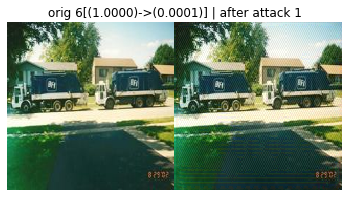

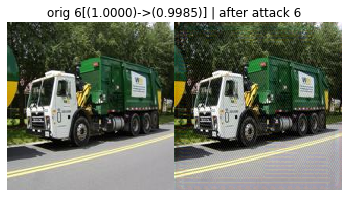

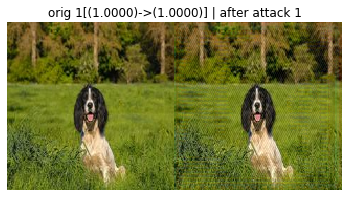

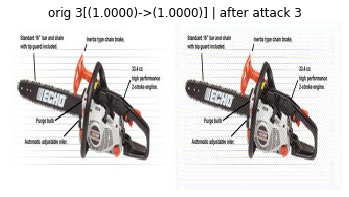

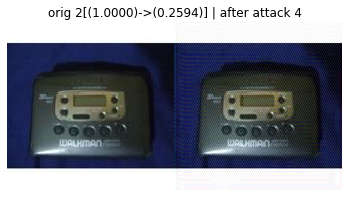

...

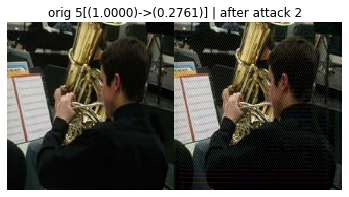

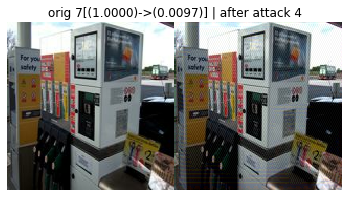

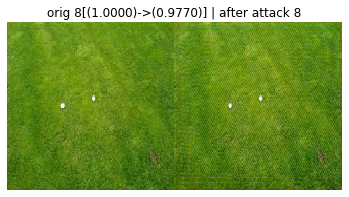

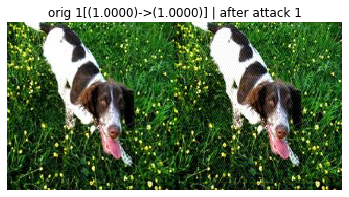

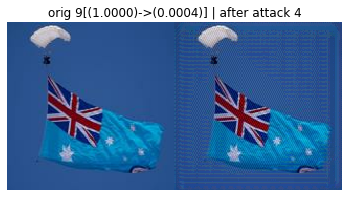

In [5]:
import yaml
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'
f = open('config.yaml','r')
config = f.read()
f.close()
config = yaml.load(config)
print(config)

S = Solver(config)
# S.eval(0)
# S.solver()
S.attack('checkpoint/ep705.pth')

In [6]:
time_start=time.time()
S.eval(705)
time_end=time.time()
print('totally cost',time_end-time_start)

Val=>Epoch [705/1000]  |  Success : 371/500.
totally cost 2.5436594486236572
